# Demo of topic modelling on vehicle GPS data

### Data Preparation

In [1]:
# Import libraries
import numpy as np
import lda
import pandas as pd
import igraph as ig

In [16]:
# Load data
X = np.genfromtxt('../data/paths_all.csv', delimiter=',',dtype='int')   # matrix [n_segments, n_journeys] storing how many times each segment was visited in each journey
print(X.shape) # 5290 street segments, 5505 journeys
vocab = pd.DataFrame.from_csv("../data/ITN_data.csv")["fid_1"].tolist()  # list with street segment ids
titles = range(1,5291) # each journey is assigned an integer

g = ig.load('../data/Camden_graph.graphml')

(5505, 5290)


### Visualisation of exemplary vehicle journeys

* Journey no. 12

In [4]:
vocab_sel = [vocab[i] for i in np.where(X[12,:]==1)[0]]

In [5]:
for edge in g.es:
    if edge['name'] in vocab_sel:
        edge['color']='red'
        edge['width'] = 4
    else:
        edge['color']='grey'
        edge['width'] = 1

In [6]:
# Fix plotting in Python (change the order of y)
temp = [-1*el for el in g.vs['y']]
g.vs['y'] = temp

In [7]:
ig.plot(g, vertex_size=0)

AttributeError: 'bytes' object has no attribute 'encode'

* Journey no. 40

In [7]:
vocab_sel = [vocab[i] for i in np.where(X[40,:]==1)[0]]

In [8]:
for edge in g.es:
    if edge['name'] in vocab_sel:
        edge['color']='red'
        edge['width'] = 4
    else:
        edge['color']='grey'
        edge['width'] = 1

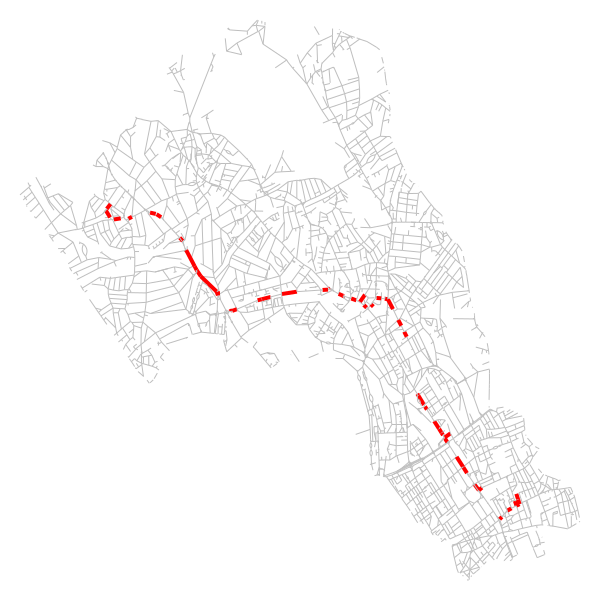

In [9]:
ig.plot(g, vertex_size=0)

### Topic Model Fitting

* 10 topics

In [37]:
model = lda.LDA(n_topics=10, n_iter=500, random_state=1)
model.fit(X)  # model.fit_transform(X) is also available

In [38]:
# Display dominant street segments per topic
topic_word = model.topic_word_  # model.components_ also works
n_top_words = 8
for i, topic_dist in enumerate(topic_word):
    topic_words = np.array(vocab)[np.argsort(topic_dist)][:-n_top_words:-1]
    print('Topic {}: {}'.format(i, ' '.join(topic_words)))

Topic 0: osgb4000000030344710 osgb4000000030239536 osgb4000000030344690 osgb4000000030344709 osgb4000000030995710 osgb4000000030239621 osgb4000000030147481
Topic 1: osgb4000000030147351 osgb4000000030344710 osgb4000000030239115 osgb4000000030147327 osgb4000000030147326 osgb4000000030239072 osgb4000000030239536
Topic 2: osgb4000000030101697 osgb4000000030153407 osgb4000000031292499 osgb4000000031138592 osgb4000000030251132 osgb4000000030355811 osgb4000000030097683
Topic 3: osgb4000000030081984 osgb4000000030223718 osgb4000000030223262 osgb4000000030223326 osgb4000000030138996 osgb4000000030139049 osgb4000000030139155
Topic 4: osgb4000000030153112 osgb4000000030153052 osgb4000000030153050 osgb4000000030250323 osgb4000000030250482 osgb4000000030250455 osgb4000000030250326
Topic 5: osgb4000000030101697 osgb4000000030250539 osgb4000000030250461 osgb4000000030250459 osgb4000000030250557 osgb4000000030153126 osgb4000000030139089
Topic 6: osgb4000000030101697 osgb4000000030153111 osgb400000003

In [39]:
# Display dominant topic per journey (for the first twenty journeys)
doc_topic = model.doc_topic_
for i in range(20):
    print("{} (top topic: {})".format(titles[i], doc_topic[i].argmax()))

1 (top topic: 1)
2 (top topic: 1)
3 (top topic: 1)
4 (top topic: 1)
5 (top topic: 5)
6 (top topic: 5)
7 (top topic: 9)
8 (top topic: 9)
9 (top topic: 5)
10 (top topic: 9)
11 (top topic: 4)
12 (top topic: 1)
13 (top topic: 5)
14 (top topic: 9)
15 (top topic: 1)
16 (top topic: 5)
17 (top topic: 6)
18 (top topic: 6)
19 (top topic: 6)
20 (top topic: 5)


In [42]:
# Assign dominant topic to each street segment
nzw = model.nzw_
for i in range(15):   # Print values for the first 15 street segments
    print("{} (top topic: {})".format(vocab[i], nzw[:,i].argmax()))
street_by_topic10 = dict(zip(vocab, np.argmax(nzw, axis=0)))

osgb4000000030101703 (top topic: 9)
osgb4000000030147329 (top topic: 1)
osgb4000000030153160 (top topic: 9)
osgb4000000030239173 (top topic: 0)
osgb4000000030250491 (top topic: 9)
osgb4000000030329930 (top topic: 3)
osgb4000000030329965 (top topic: 5)
osgb4000000030344204 (top topic: 1)
osgb4000000030344292 (top topic: 0)
osgb4000000030344319 (top topic: 1)
osgb4000000030355054 (top topic: 5)
osgb4000000030411096 (top topic: 8)
osgb4000000030425142 (top topic: 1)
osgb4000000030425143 (top topic: 0)
osgb4000000030425144 (top topic: 6)


In [43]:
# Output the result
with open('../results/street_by_topic10.csv','w') as outfile:
    outfile.write('fid,topics\n')
    for fid, topic in street_by_topic10.items():
        outfile.write(fid+','+str(topic)+'\n')

* 15 topics

In [12]:
model15 = lda.LDA(n_topics=15, n_iter=500, random_state=1)
model15.fit(X)  # model.fit_transform(X) is also available

<lda.lda.LDA instance at 0x000000000C55B108>

In [13]:
# Assign dominant topic to each street segment
nzw15 = model15.nzw_
street_by_topic = zip(vocab, np.argmax(nzw15, axis=0)) 

In [23]:
# Export the results
with open('../results/results_lda_real_first100000_topics15.csv','w') as outfile:
    outfile.write('fid,topics\n')
    for fid, topic in street_by_topic:
        outfile.write(fid+','+str(topic)+'\n')

* 100 topics

In [15]:
model100 = lda.LDA(n_topics=100, n_iter=500, random_state=1)
model100.fit(X)  # model.fit_transform(X) is also available

<lda.lda.LDA instance at 0x00000000550A15C8>

In [16]:
# Assign dominant topic to each street segment
nzw100 = model100.nzw_
street_by_topic100 = zip(vocab, np.argmax(nzw100, axis=0)) 

* 50 topics

In [119]:
model50 = lda.LDA(n_topics=50, n_iter=500, random_state=1)
model50.fit(X)  # model.fit_transform(X) is also available

<lda.lda.LDA instance at 0x000000006107B648>

In [120]:
nzw50 = model50.nzw_
street_by_topic50 = zip(vocab, np.argmax(nzw50, axis=0)) 

* 150

In [17]:
model150 = lda.LDA(n_topics=150, n_iter=500, random_state=1)
model150.fit(X)  # model.fit_transform(X) is also available

In [26]:
nzw150 = model150.nzw_
street_by_topic150 = dict(zip(vocab, np.argmax(nzw150, axis=0)))

In [36]:
# Output the result
with open('../results/street_by_topic150.csv','w') as outfile:
    outfile.write('fid,topics\n')
    for fid, topic in street_by_topic150.items():
        outfile.write(fid+','+str(topic)+'\n')

### Visualising Results

* Import plotting libraries

In [14]:
import matplotlib.pyplot as plt
%matplotlib inline

import shapefile   #(Do in terminal: pip install pyshp)

* Read in Camden's street network

In [15]:
# read graph object
g = ig.load('../data/Camden_graph.graphml')

* Assign dominant topic to each street segment in the network

In [18]:
# Add topic attribute to each edge
for record in street_by_topic:
    edge = g.es.find(name = record[0])
    edge["topic15"] = int(record[1])
# for record in street_by_topic100:
#     edge = g.es.find(name = record[0])
#     edge["topic100"] = int(record[1])
print g.es[1]

igraph.Edge(<igraph.Graph object at 0x0000000013B96C78>, 1, {'topic15': 1, 'Pstop': 0.0, 'topic10': 1, 'weight': 293.72, 'name': 'osgb4000000030147329'})


In [19]:
# Fix plotting in Python (change the order of y)
temp = [-1*el for el in g.vs['y']]
g.vs['y'] = temp

* Plot the results

    * 10 topics

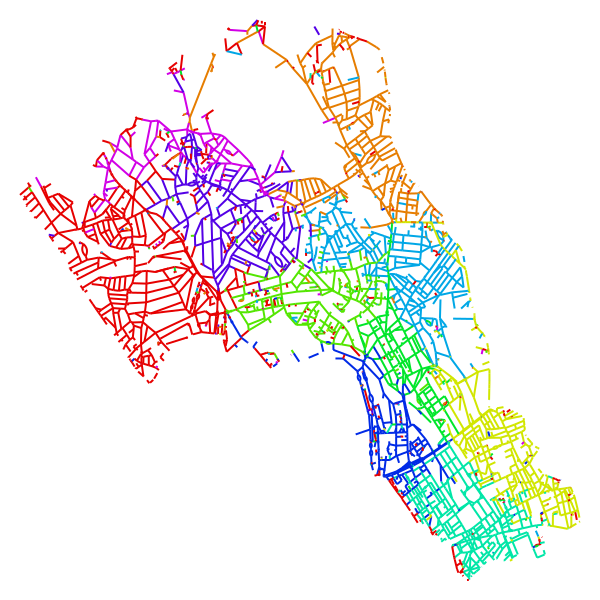

In [135]:
pal = ig.RainbowPalette(n=11,s=1,v=0.9)
# pal = ig.GradientPalette(color1='red', color2 = 'blue',n=101)
ig.plot(g, vertex_size=0,edge_width=2,x='x',y='y',edge_color=[pal[topic10] for topic10 in g.es["topic10"]])

In [14]:
street_by_topic[0]

('osgb4000000030101703', 6)

In [254]:
# Plot only a few selected topics
pal = ig.RainbowPalette(n=51,s=1,v=0.9)
for record in street_by_topic50:
    edge = g.es.find(name = record[0])
    topic_no = int(record[1])
#     edge["color"] = pal[topic_no]
#     edge['width'] = 2
    
    if topic_no in [8]:     #[1,8,11,13,15]
        edge["color"] = pal[topic_no+1]
        edge['width'] = 4
    else:
        edge['color'] = (0.7450980392156863, 0.7450980392156863, 0.7450980392156863, 0.5)
        edge['width'] = 0   #1

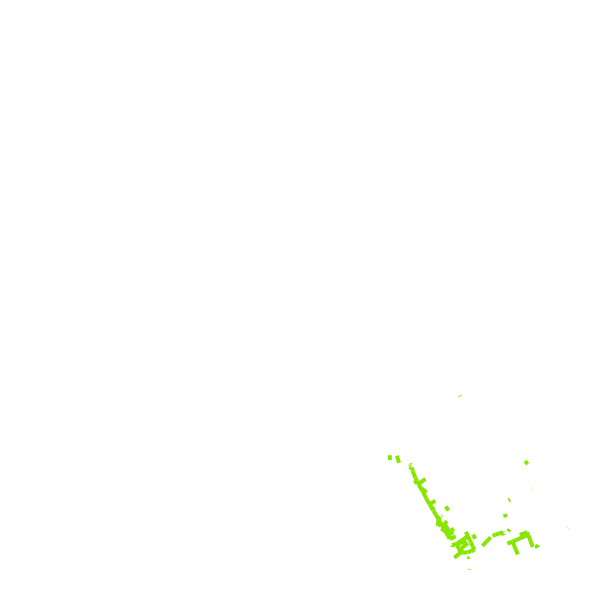

In [255]:
ig.plot(g, vertex_size=0)

In [256]:
plot = ig.plot(g,vertex_size=0,bbox=(2000,2000))
plot.background = None
plot.redraw()

In [257]:
plot.save('topics50_lda_real_topic8.png')

* 15 topics

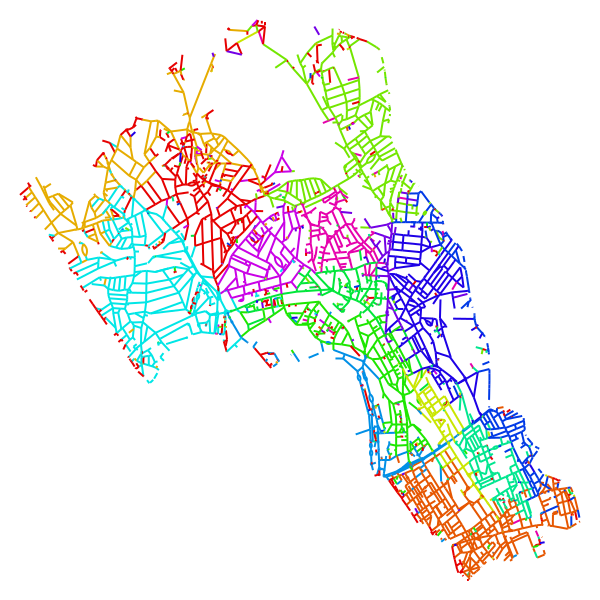

In [20]:
pal = ig.RainbowPalette(n=16,s=1,v=0.9)
# pal = ig.GradientPalette(color1='red', color2 = 'blue',n=101)
ig.plot(g, vertex_size=0,edge_width=2,x='x',y='y',edge_color=[pal[topic10] for topic10 in g.es["topic15"]])

    * 100 topics

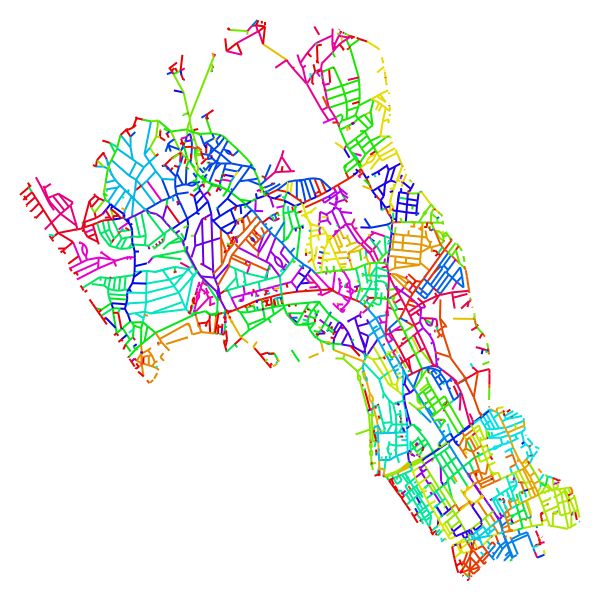

In [22]:
pal = ig.RainbowPalette(n=101,s=1,v=0.9)
# pal = ig.GradientPalette(color1='red', color2 = 'blue',n=101)
ig.plot(g, vertex_size=0,edge_width=2,x='x',y='y',edge_color=[pal[topic100] for topic100 in g.es["topic100"]])

### Comparing results to Louvain variants

* Import Louvain results

In [46]:
# Import louvain results
results_dir = '../../network clustering/louvain community/gen_louvain/'

In [47]:
# Load vertex ids
node_ids = []
with open(results_dir + 'data/netnodes_vocab.csv','r') as infile:
    for row in infile:
        node_id = row.rstrip()
        node_ids.append(node_id)

In [48]:
# Create a dict storing community assignments of nodes
nodes_com1 = {}
coms_def1 = []
with open(results_dir+'results/com_def1.csv','r') as infile:
    for i,row in enumerate(infile):
        com = int(row.rstrip())
        coms_def1.append(com)
        nodes_com1[node_ids[i]] = com   

In [49]:
nodes_com2 = {}
coms_def2 = []
with open(results_dir+'results/com_def2.csv','r') as infile:
    for i,row in enumerate(infile):
        com = int(row.rstrip())
        coms_def2.append(com)
        nodes_com2[node_ids[i]] = com   

In [55]:
# Import Toby's street network
tobys_dir = '../../topic modelling/data/itn directed network from toby/'

In [56]:
g_toby = ig.load(tobys_dir + 'camden_buff100_physical.graphml')

In [58]:
from pickle import load, dump
with open(tobys_dir + 'camden_buff100_node_positions.pkl','rb') as infile:
    node_positions = load(infile,encoding='latin1')
with open(tobys_dir + 'camden_buff100_edge_polylines_kira.pkl','rb') as infile:
    edge_polylines = load(infile,encoding='latin1')

In [59]:
# Add x,y to nodes
for vertex in g_toby.vs:
    fid = vertex['id']
    vertex['x'] = node_positions[fid][0]
    vertex['y'] = -node_positions[fid][1]

In [60]:
# Change node assignments to edge assignments
street_by_com1 = []
for edge in g_toby.es:
    comS = nodes_com1[g_toby.vs[edge.source]['id']]
    street_by_com1.append((edge['fid'],comS))

In [61]:
street_by_com2 = []
for edge in g_toby.es:
    comS = nodes_com2[g_toby.vs[edge.source]['id']]
    street_by_com2.append((edge['fid'],comS))

In [63]:
# Output the result
with open('../results/street_by_comdef1.csv','w') as outfile:
    outfile.write('fid,com\n')
    for fid, com in street_by_com1:
        outfile.write(fid+','+str(com)+'\n')
        
with open('../results/street_by_comdef2.csv','w') as outfile:
    outfile.write('fid,com\n')
    for fid, com in street_by_com2:
        outfile.write(fid+','+str(com)+'\n')

* Compute mutual information score between louvain and lda

In [38]:
from sklearn.metrics import adjusted_mutual_info_score

In [30]:
# Get an ordered list of edges
edge_ids = list(street_by_topic150.keys())

In [55]:
# Sort results

In [31]:
# fids,topics = zip(*street_by_topic150)
street_by_topic150_sorted = []
for fid in edge_ids:
    street_by_topic150_sorted.append(street_by_topic150[fid])

* Perhaps change zip to dict in the following examples as well

In [57]:
fids,topics = zip(*street_by_topic50)
street_by_topic50_sorted = []
for fid in edge_ids:
    idx = fids.index(fid)
    street_by_topic50_sorted.append(topics[idx])

In [59]:
fids,topics = zip(*street_by_topic)
street_by_topic10_sorted = []
for fid in edge_ids:
    idx = fids.index(fid)
    street_by_topic10_sorted.append(topics[idx])

In [60]:
fids,topics = zip(*street_by_topic100)
street_by_topic100_sorted = []
for fid in edge_ids:
    idx = fids.index(fid)
    street_by_topic100_sorted.append(topics[idx])

In [63]:
fids,topics = zip(*street_by_com1)
street_by_com1_sorted = []
for fid in edge_ids:
    idx = fids.index(fid)
    street_by_com1_sorted.append(topics[idx])

In [64]:
fids,topics = zip(*street_by_com2)
street_by_com2_sorted = []
for fid in edge_ids:
    idx = fids.index(fid)
    street_by_com2_sorted.append(topics[idx])

In [132]:
# Compute mutual information score
print adjusted_mutual_info_score(street_by_com1_sorted,street_by_topic10_sorted)
print adjusted_mutual_info_score(street_by_com1_sorted,street_by_topic50_sorted)
print adjusted_mutual_info_score(street_by_com1_sorted,street_by_topic100_sorted)
print adjusted_mutual_info_score(street_by_com1_sorted,street_by_topic150_sorted)

0.305831893032
0.451676198647
0.481081069552
0.445839814408


In [133]:
print adjusted_mutual_info_score(street_by_com2_sorted,street_by_topic10_sorted)
print adjusted_mutual_info_score(street_by_com2_sorted,street_by_topic50_sorted)
print adjusted_mutual_info_score(street_by_com2_sorted,street_by_topic100_sorted)
print adjusted_mutual_info_score(street_by_com2_sorted,street_by_topic150_sorted)

0.135896528544
0.182847321755
0.193838437768
0.195057801808


In [134]:
import matplotlib.pyplot as plt
%matplotlib inline

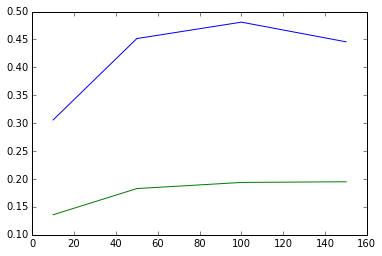

In [136]:
plt.plot([10,50,100,150],[0.305831893032,0.451676198647,0.481081069552,0.445839814408],[10,50,100,150],[0.135896528544,0.182847321755,0.193838437768,0.195057801808])

## Plot results in a similar style to louvain variants

In [71]:
# Note: topics are numbered from zero, commnities from one.

In [126]:
import collections
counter=collections.Counter(street_by_topic150_sorted)

In [127]:
counter

Counter({0: 558, 109: 99, 43: 93, 142: 74, 91: 68, 149: 66, 37: 63, 35: 61, 60: 57, 19: 56, 121: 54, 26: 53, 30: 53, 33: 53, 117: 53, 94: 52, 135: 52, 41: 51, 97: 50, 38: 49, 56: 49, 6: 48, 14: 48, 17: 48, 22: 48, 28: 48, 48: 48, 136: 48, 89: 46, 73: 45, 71: 44, 113: 44, 10: 43, 70: 43, 141: 42, 95: 41, 62: 40, 110: 40, 123: 40, 23: 39, 27: 39, 82: 39, 9: 38, 32: 38, 34: 38, 122: 38, 20: 37, 40: 37, 76: 37, 3: 36, 52: 36, 7: 35, 50: 35, 57: 35, 105: 35, 106: 35, 42: 34, 51: 34, 65: 34, 47: 33, 78: 33, 98: 33, 108: 33, 148: 33, 112: 32, 145: 32, 12: 31, 68: 31, 101: 31, 104: 31, 16: 30, 39: 30, 63: 30, 84: 30, 92: 30, 103: 30, 120: 30, 1: 29, 31: 29, 86: 29, 21: 28, 66: 28, 80: 28, 138: 28, 4: 27, 5: 27, 11: 27, 29: 27, 128: 27, 139: 27, 85: 26, 118: 26, 44: 25, 64: 25, 77: 25, 24: 24, 36: 24, 55: 24, 59: 24, 46: 23, 114: 23, 125: 23, 2: 22, 67: 22, 96: 22, 115: 22, 143: 22, 75: 21, 79: 21, 100: 21, 119: 21, 124: 21, 13: 20, 18: 20, 53: 20, 25: 19, 58: 19, 69: 19, 87: 19, 61: 18, 88: 18

In [128]:
coms = list(street_by_topic150_sorted)
pal = ig.RainbowPalette(n=len(np.unique(coms)),s=1,v=0.9)
pal_iter = [col for col in pal]
for edge in g_toby.es:
    fid = edge['fid']
    if fid in edge_ids: 
        idx = edge_ids.index(fid)
        com = coms[idx]

        edge_color = pal_iter[com] 
        com_size = len(np.where(np.asarray(coms)==com)[0])
        
        if com_size>10:
            edge_transparency = 1.0
        else:
            edge_transparency = float(com_size)/10
        
        final_edge_color = list(edge_color)
        final_edge_color[3] = edge_transparency
    
        edge['color'] = tuple(final_edge_color)
    else:
        edge['color'] = (0.0, 0.0, 0.0, 0.0)

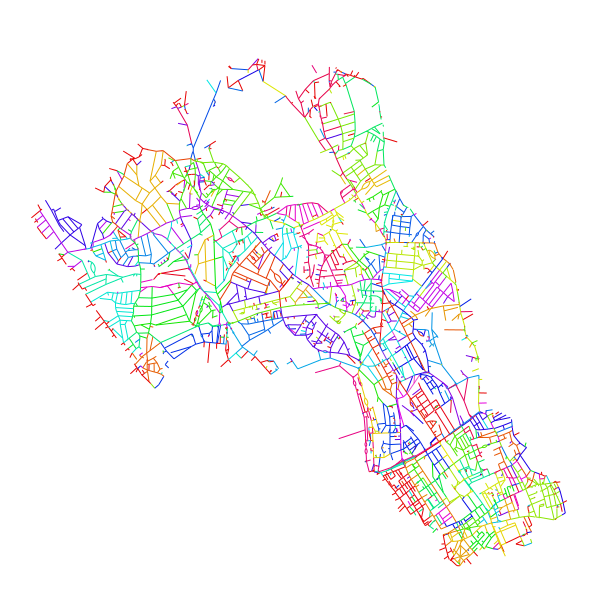

In [129]:
ig.plot(g_toby,vertex_size=0)

In [130]:
plot = ig.plot(g_toby,vertex_size=0)
plot.background = None
plot.redraw()

In [131]:
plot.save('topics150.png')

* Export results for various topic numbers

In [10]:
topic_numbers = range(0,301)[::10][1:]

In [15]:
for topic_no in topic_numbers:
    
    print topic_no
    
    model = lda.LDA(n_topics=topic_no, n_iter=500, random_state=1)
    model.fit(X)  # model.fit_transform(X) is also available
    
    nzw = model.nzw_
    street_by_topic = zip(vocab, np.argmax(nzw, axis=0)) 
    
    # Export results
    with open('../results/lda_iterations/lda_topics'+str(topic_no)+'.csv','w') as outfile:
        for line in street_by_topic:
            outfile.write(line[0]+','+str(line[1])+'\n')   

10
20


30


40


50


60


70


80


90


100


110


120


130


140


150


160


170


180


190


200


210


220


230


240


250


260


270


280


290


300